<b>Authors</b>: <i>Alberto Vavassori (alberto.vavassori@polimi.it), Capizzi Emanuele (emanuele.capizzi@polimi.it) - DICA - Politecnico di Milano - GIS GEOLab. </i>

<i>Developed within the LCZ-ODC project, funded by the Italian Space Agency (agreement n. 2022-30-HH.0) </i>

---
# Co-registration of PRISMA imagery with Sentinel-2 imagery through GeFolki algorithm

This notebook is meant to co-register PRISMA imagery (SWIR and NIR data cubes) using Sentinel-2 pre-processed imagery as reference. <br> 
Co-registration is performed using the Ge-Folki algorithm (reference GitHub page for Geofolki algorithm: [Link](https://github.com/aplyer/gefolki)) which is based on Optical-Flow Computation.

<a id='TOC_TOP'></a>

The main steps implemented in this notebook are the following: <br>
 1. [opening PRISMA file (provided in .he5 format), reading and extracting image data](#sec1)  
 2. [importing the pre-processed Sentinel-2 image clipped to PRISMA image extent (i.e. result obtained through the notebook `1 - S2_Preprocessing.ipynb`) and resample it at 30m resolution](#sec2)
 3. [application of the AROSICS algorithm](#sec3)  
 4. [exporting the original non co-registered PRISMA bands (RGB composite and all NIR/SWIR bands) as well as the co-registered PRISMA bands (RGB composite and all NIR/SWIR bands); the bands combinations are exported in GeoTIFF](#sec4)
 5. [Panchromatic coregistration and export](#sec5)
<hr>

## 1. <a id='sec1'></a>Opening PRISMA file, reading and extracting image data

**REQUIREMENT**: installation of [***h5py***](https://docs.h5py.org/en/stable/quick.html) library from command line with `pip install h5py`.
Libraries required for running the code:
- `h5py`
- `numpy`
- `matplotlib`
- `rasterio`
- `os`
- `pylab`
- `ipwidgets`
- GeFolki functionalities (`EFolki` and `wrapData`)

In [2]:
#Import libraries
import h5py
import numpy as np
import rasterio as rio
from rasterio.plot import show
from rasterio.plot import show_hist
from rasterio.warp import reproject, Resampling
import matplotlib.pyplot as plt
from matplotlib.ticker import MaxNLocator
import pylab as pl
import os
import ipywidgets as widgets
import pandas as pd

# Import Gefolki functionalities
import sys
sys.path.append('python')
from algorithm import EFolki
from tools import wrapData

Open the file containing the PRISMA image (.he5 file):

In [3]:
f = h5py.File('data/PRISMA/PRS_L2D_STD_20230209102412_20230209102416_0001.he5', 'r')

Print the list of keys. Each key can be accessed to explore the image metadata:

In [4]:
list(f.keys())

['HDFEOS', 'HDFEOS INFORMATION', 'Info', 'KDP_AUX']

(Optionally) it is possible to read names and values for root attributes (metadata contained in `HDF5` root):

for attribute in f.attrs:
     print(attribute,f.attrs[attribute])

(Optionally) it is possible to read the names for all attributes (metadata) contained in the `HDF5` Groups. Specific method for reading the values shall be built depending on the specific metadata type (a single value, an array, a matrix, etc):

In [5]:
def printname(name):
     print(name)

f.visit(printname)

HDFEOS
HDFEOS/SWATHS
HDFEOS/SWATHS/GCP attributes
HDFEOS/SWATHS/Geocoding attributes
HDFEOS/SWATHS/Geocoding attributes/Ancillary
HDFEOS/SWATHS/PRS_L2D_HCO
HDFEOS/SWATHS/PRS_L2D_HCO/Data Fields
HDFEOS/SWATHS/PRS_L2D_HCO/Data Fields/SWIR_Cube
HDFEOS/SWATHS/PRS_L2D_HCO/Data Fields/SWIR_PIXEL_L2_ERR_MATRIX
HDFEOS/SWATHS/PRS_L2D_HCO/Data Fields/VNIR_Cube
HDFEOS/SWATHS/PRS_L2D_HCO/Data Fields/VNIR_PIXEL_L2_ERR_MATRIX
HDFEOS/SWATHS/PRS_L2D_HCO/Geocoding Model
HDFEOS/SWATHS/PRS_L2D_HCO/Geolocation Fields
HDFEOS/SWATHS/PRS_L2D_HCO/Geolocation Fields/Latitude
HDFEOS/SWATHS/PRS_L2D_HCO/Geolocation Fields/Longitude
HDFEOS/SWATHS/PRS_L2D_HCO/Geolocation Fields/Time
HDFEOS/SWATHS/PRS_L2D_HCO/Geometric Fields
HDFEOS/SWATHS/PRS_L2D_HCO/Geometric Fields/Observing_Angle
HDFEOS/SWATHS/PRS_L2D_HCO/Geometric Fields/Rel_Azimuth_Angle
HDFEOS/SWATHS/PRS_L2D_HCO/Geometric Fields/Solar_Zenith_Angle
HDFEOS/SWATHS/PRS_L2D_PCO
HDFEOS/SWATHS/PRS_L2D_PCO/Data Fields
HDFEOS/SWATHS/PRS_L2D_PCO/Data Fields/Cube
HDFEOS

List the band wavelengths available in the VNIR cube:

In [6]:
for attr in f.attrs:
    print(attr)

Acquisition_Purpose
Acquisition_Size
Acquisition_Station
Acquisition_Type
Atm_LutGeomInfo_RelativeAzimuth
Atm_LutGeomInfo_SunZenith
Atm_LutGeomInfo_ViewZenith
Atm_Lut_version
Atmo_RTM_info
Atmo_profile_info
Aux_SunEarthDistance
Aux_SunIrradiance
CNM_L2_BINNING
CNM_L2_BIN_ON
CNM_L2_BSEL_ON
CNM_L2_HGRP
CNM_PAN_ACQ
CNM_SWIR_ACQ
CNM_SWIR_SELECT
CNM_VNIR_ACQ
CNM_VNIR_SELECT
Cloudy_pixels_percentage
DEM_info
Epsg_Code
Exit_Code
Frame_Type
GCP_info
ISF_ID_Start
Image_ID
Integration_Time
L1_Processor_Version
L1_Quality_CCPerc
L2ScalePanMax
L2ScalePanMin
L2ScaleSwirMax
L2ScaleSwirMin
L2ScaleVnirMax
L2ScaleVnirMin
L2d_Quality_flags
List_Cw_Swir
List_Cw_Swir_Flags
List_Cw_Vnir
List_Cw_Vnir_Flags
List_Fwhm_Swir
List_Fwhm_Vnir
Main_Electornic_Unit
Map_AOT_accuracy
Map_WV_accuracy
Num_Frames
Number_of_ISF
PANCorruptedFrameList
PAN_ACQ
PAN_Corrupted_Frame_Percentage
PAN_HGRP
PAN_HYP_ACT_RESIDUAL_m
PAN_HYP_ALT_RESIDUAL_m
PAN_HYP_START_SYNC_FRAME
PAN_HYP_START_SYNC_SUBFRAME
PAN_HYP_STOP_SYNC_FRAME
PAN_

In [7]:
vnir_bands = f.attrs['List_Cw_Vnir']
len(vnir_bands)

66

List the band wavelengths available in the SWIR cube:

In [8]:
swir_bands = f.attrs['List_Cw_Swir']
len(swir_bands)

173

In [9]:
print(f"Number of VNIR Bands: {len(vnir_bands)}")

Number of VNIR Bands: 66


In [10]:
print(f"Number of SWIR Bands: {len(swir_bands)}")

Number of SWIR Bands: 173


Bands are stored in the two data cubes from larger to smaller wavelengths, but it is preferable to have them stored inversely. <br>
Therefore, a dictionary is created with keys containing the band number and value containing the wavelength. The first band has the smallest key:

In [11]:
vnir_dict = {}

for i, band in enumerate(vnir_bands):
    vnir_dict[len(vnir_bands) - i] = band

print(vnir_dict)

{66: 0.0, 65: 0.0, 64: 0.0, 63: 977.3654, 62: 967.0267, 61: 956.2715, 60: 944.6273, 59: 934.11206, 58: 923.9502, 57: 913.44507, 56: 902.80164, 55: 892.08093, 54: 881.45605, 53: 870.74255, 52: 859.97314, 51: 849.20996, 50: 838.5272, 49: 827.9195, 48: 817.31104, 47: 806.71106, 46: 796.127, 45: 785.65955, 44: 775.2735, 43: 764.85645, 42: 754.4696, 41: 744.14954, 40: 733.9552, 39: 723.87994, 38: 713.72687, 37: 703.737, 36: 694.12836, 35: 684.13727, 34: 674.46436, 33: 664.8941, 32: 655.41876, 31: 645.9638, 30: 636.6763, 29: 627.77844, 28: 618.72, 27: 609.9582, 26: 601.0144, 25: 592.339, 24: 583.8441, 23: 575.4868, 22: 567.2061, 21: 559.02026, 20: 550.9146, 19: 542.88513, 18: 535.05255, 17: 527.3053, 16: 519.54376, 15: 512.0464, 14: 504.51172, 13: 497.05865, 12: 489.79486, 11: 482.54816, 10: 475.31885, 9: 468.09842, 8: 460.73175, 7: 453.38947, 6: 446.0147, 5: 438.6569, 4: 431.3347, 3: 423.78476, 2: 415.839, 1: 406.9934}


In [12]:
swir_dict = {}

for i, band in enumerate(swir_bands):
    swir_dict[len(swir_bands) - i] = band

print(swir_dict)

{173: 2497.1155, 172: 2490.2192, 171: 2483.793, 170: 2477.055, 169: 2469.6272, 168: 2463.0303, 167: 2456.5857, 166: 2449.1423, 165: 2442.403, 164: 2435.5442, 163: 2428.6677, 162: 2421.2373, 161: 2414.3567, 160: 2407.6045, 159: 2400.036, 158: 2393.0388, 157: 2386.0618, 156: 2378.771, 155: 2371.5522, 154: 2364.5945, 153: 2357.2937, 152: 2349.7915, 151: 2342.8228, 150: 2335.5264, 149: 2327.8242, 148: 2320.8955, 147: 2313.2007, 146: 2305.7227, 145: 2298.6094, 144: 2290.8267, 143: 2283.4934, 142: 2276.0537, 141: 2268.2883, 140: 2260.8665, 139: 2253.1104, 138: 2245.4485, 137: 2237.904, 136: 2230.0076, 135: 2222.4263, 134: 2214.625, 133: 2206.843, 132: 2199.1353, 131: 2191.1003, 130: 2183.4202, 129: 2175.3442, 128: 2167.4849, 127: 2159.564, 126: 2151.3862, 125: 2143.4656, 124: 2135.5103, 123: 2127.3372, 122: 2119.2314, 121: 2111.039, 120: 2102.8213, 119: 2094.6252, 118: 2086.3823, 117: 2077.9915, 116: 2069.7957, 115: 2061.3787, 114: 2053.0078, 113: 2044.6809, 112: 2036.2607, 111: 2027.7267, 1

The following indexes are corresponding to NIR, red, green and blue wavelenghts (Keep the same band notation as ENMAP plugin where these bands have this meaning):

In [13]:
# Index of NIR red, green and blue in the VNIR cube
idx_nir = 51
idx_red = 33
idx_green = 23
idx_blue = 11

In [14]:
print(f"NIR wvl: {vnir_dict[idx_nir]}, \nRed wvl: {vnir_dict[idx_red]}, \nGreen wvl: {vnir_dict[idx_green]}, \nBlue wvl: {vnir_dict[idx_blue]}")

NIR wvl: 849.2099609375, 
Red wvl: 664.8941040039062, 
Green wvl: 575.48681640625, 
Blue wvl: 482.54815673828125


Store the NIR and SWIR keys (band number) in two lists:

In [15]:
vnir_keys = list(vnir_dict.keys())

In [16]:
swir_keys = list(swir_dict.keys())

PRISMA images are stored in the inverse order. So we must obtain the position of the band in the cube (using its index) and use that position to extract the image:

In [17]:
# #Index of the NIR(849 nm - Band 51) Red (660.26361nm - Band 33), Blue (478.1763nm - Band 11), and Green (571.00281nm - Band 23) bands:
idx_nir_prisma = vnir_keys.index(idx_nir)
idx_red_prisma = vnir_keys.index(idx_red)
idx_green_prisma = vnir_keys.index(idx_green)
idx_blue_prisma = vnir_keys.index(idx_blue)
print(f"The NIR band number {idx_nir} has position {idx_nir_prisma}")
print(f"The Red band number {idx_red} has position {idx_red_prisma}")
print(f"The Green band number {idx_green} has position {idx_green_prisma}")
print(f"The Blue band number {idx_blue} has position {idx_blue_prisma}")

The NIR band number 51 has position 15
The Red band number 33 has position 33
The Green band number 23 has position 43
The Blue band number 11 has position 55


Let's read and store attributes and wavelengths (_needed to choose the specific bands_) in separate arrays:

In [18]:
# Attributes
attrs = f.attrs

# Wavelengths (separately for VNIR and SWIR)
vn_wvl = np.array([wvl for wvl in attrs['List_Cw_Vnir']])
sw_wvl = np.array([wvl for wvl in attrs['List_Cw_Swir']])

# #Index of the Red (660.26361nm - Band 33), Blue (478.1763nm - Band 11), and Green (571.00281nm - Band 23) bands:
# idx_red = np.where(vn_wvl == 664.8941)[0][0]
# idx_blue = np.where(vn_wvl == 475.31885)[0][0]
# idx_green = np.where(vn_wvl == 575.4868)[0][0]

In [19]:
vn_wvl

array([  0.     ,   0.     ,   0.     , 977.3654 , 967.0267 , 956.2715 ,
       944.6273 , 934.11206, 923.9502 , 913.44507, 902.80164, 892.08093,
       881.45605, 870.74255, 859.97314, 849.20996, 838.5272 , 827.9195 ,
       817.31104, 806.71106, 796.127  , 785.65955, 775.2735 , 764.85645,
       754.4696 , 744.14954, 733.9552 , 723.87994, 713.72687, 703.737  ,
       694.12836, 684.13727, 674.46436, 664.8941 , 655.41876, 645.9638 ,
       636.6763 , 627.77844, 618.72   , 609.9582 , 601.0144 , 592.339  ,
       583.8441 , 575.4868 , 567.2061 , 559.02026, 550.9146 , 542.88513,
       535.05255, 527.3053 , 519.54376, 512.0464 , 504.51172, 497.05865,
       489.79486, 482.54816, 475.31885, 468.09842, 460.73175, 453.38947,
       446.0147 , 438.6569 , 431.3347 , 423.78476, 415.839  , 406.9934 ],
      dtype=float32)

Let's store the pixel coordinates (latitude and longitude) in two arrays (lat, lon):

In [20]:
data = f['HDFEOS']['SWATHS']['PRS_L2D_HCO']

lat = np.array(data['Geolocation Fields']['Latitude'][:])
lon = np.array(data['Geolocation Fields']['Longitude'][:])

Let's get the spectral information of each data cube and correct the dimensions of the arrays to get depth as the third dimension:

In [21]:
vrf = np.array(data['Data Fields']['VNIR_Cube'][:]) 
srf = np.array(data['Data Fields']['SWIR_Cube'][:]) 
print(vrf.shape)
print(srf.shape)

(1206, 66, 1230)
(1206, 173, 1230)


In [22]:
#move the number of wavelengths to the last position:
vrf = np.moveaxis(vrf, 1, 2)
srf = np.moveaxis(srf, 1, 2)
print(vrf.shape)
print(srf.shape)

(1206, 1230, 66)
(1206, 1230, 173)


Let's now convert the values stored in the data cubes from DN to spectral reflectance. To do so, we need to access the scaling factors availables among the attributes, namely `L2ScaleVnirMax` and `L2ScaleVnirMax` for the NIR cube, and `L2ScaleSwirMax` and `L2ScaleSwirMax` for the SWIR cube. Then, let's apply the formula provided in the documentation:


In [23]:
L2ScaleVnirMax = attrs['L2ScaleVnirMax']
L2ScaleVnirMin = attrs['L2ScaleVnirMin']
L2ScaleSwirMax = attrs['L2ScaleSwirMax']
L2ScaleSwirMin = attrs['L2ScaleSwirMin']
print(f"VNIR min: {L2ScaleVnirMin}, VNIR max: {L2ScaleVnirMax}")
print(f"SWIR min: {L2ScaleSwirMin}, SWIR max: {L2ScaleSwirMax}")

SR_scaler = 65535

vrf_refl = L2ScaleVnirMin + vrf*(L2ScaleVnirMax - L2ScaleVnirMin) / SR_scaler
srf_refl = L2ScaleSwirMin + srf*(L2ScaleSwirMax - L2ScaleSwirMin) / SR_scaler

VNIR min: 0.0, VNIR max: 0.9864950180053711
SWIR min: 0.0, SWIR max: 1.0


Select the NIR, red, green, blue bands from the scaled VNIR cube, and plot them:

In [24]:
nir_band_prisma = vrf_refl[:, :, idx_nir_prisma]
red_band_prisma = vrf_refl[:, :, idx_red_prisma]
green_band_prisma = vrf_refl[:, :, idx_green_prisma]
blue_band_prisma = vrf_refl[:, :, idx_blue_prisma]

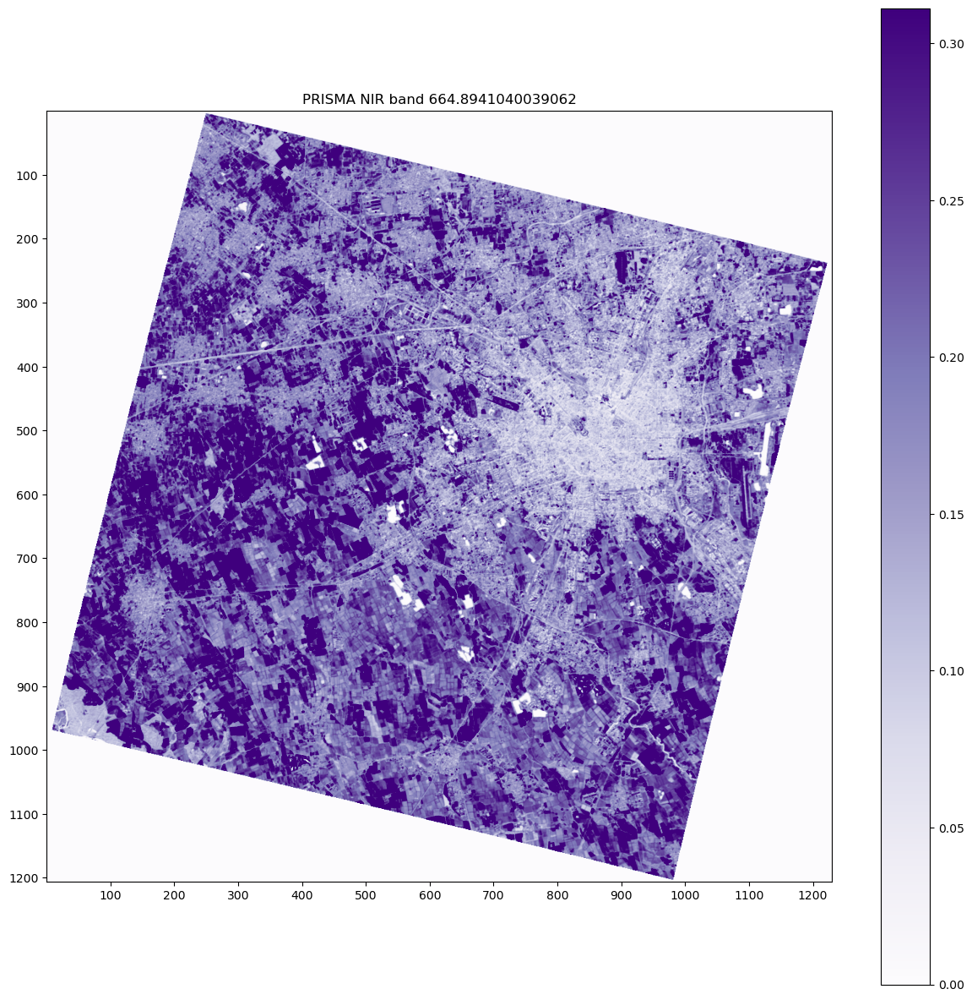

In [25]:
plt.figure(figsize = (15,15))
height, width = nir_band_prisma.shape
extent = [0, width, height, 0]  # left, right, bottom, top
plt.imshow(nir_band_prisma, cmap="Purples", vmin=-np.quantile(nir_band_prisma, 0.1), vmax=np.quantile(nir_band_prisma, 0.9), extent=extent)

plt.gca().xaxis.set_major_locator(MaxNLocator(integer=True, prune='both', nbins=width//100+1))
plt.gca().yaxis.set_major_locator(MaxNLocator(integer=True, prune='both', nbins=height//100+1))
plt.title(f'PRISMA NIR band {vnir_dict[idx_red]}')
plt.colorbar()

'''NIR Band stored in a dedicated array'''
PRISMA_NirBand = nir_band_prisma

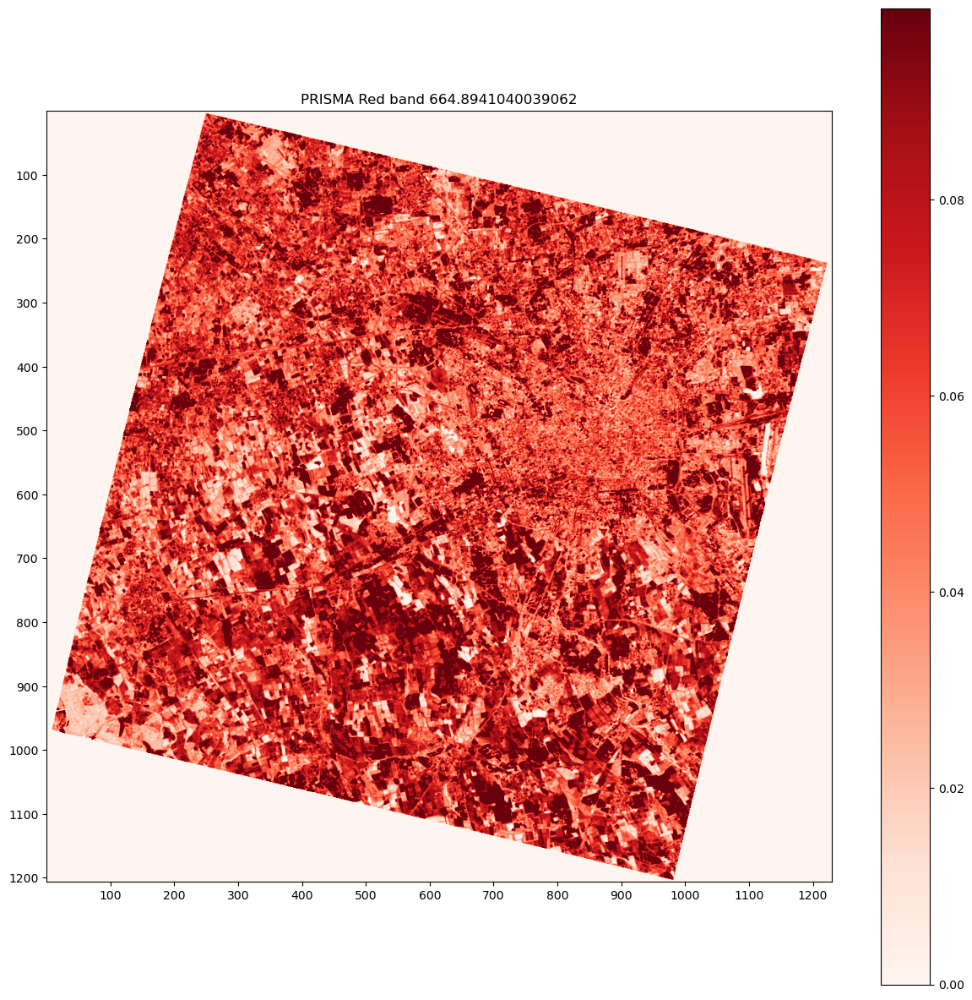

In [26]:
plt.figure(figsize = (15,15))
height, width = red_band_prisma.shape
extent = [0, width, height, 0]  # left, right, bottom, top
plt.imshow(red_band_prisma, cmap="Reds", vmin=-np.quantile(red_band_prisma, 0.1), vmax=np.quantile(red_band_prisma, 0.9), extent=extent)

plt.gca().xaxis.set_major_locator(MaxNLocator(integer=True, prune='both', nbins=width//100+1))
plt.gca().yaxis.set_major_locator(MaxNLocator(integer=True, prune='both', nbins=height//100+1))
plt.title(f'PRISMA Red band {vnir_dict[idx_red]}')
plt.colorbar()

'''Red Band stored in a dedicated array'''
PRISMA_RedBand = red_band_prisma

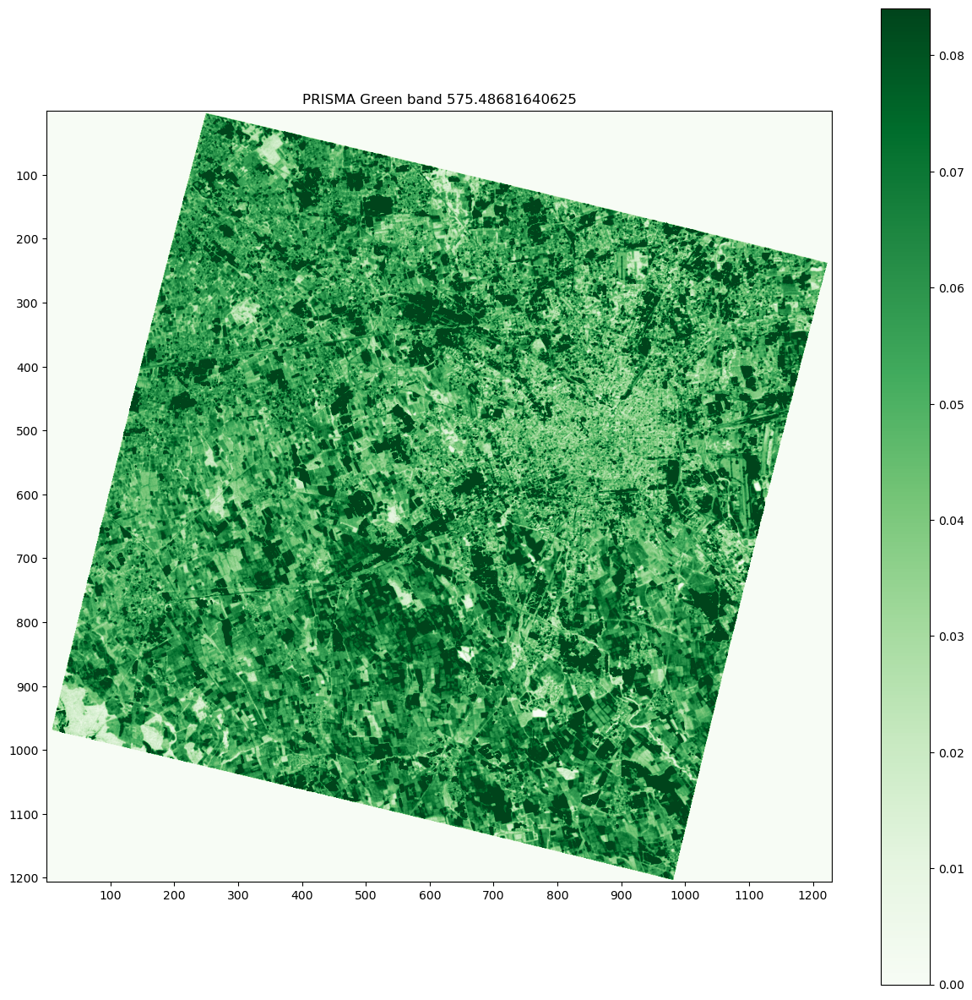

In [27]:
plt.figure(figsize = (15,15))
height, width = green_band_prisma.shape
extent = [0, width, height, 0]  # left, right, bottom, top
plt.imshow(green_band_prisma, cmap="Greens", vmin=-np.quantile(green_band_prisma, 0.1), vmax=np.quantile(green_band_prisma, 0.9), extent=extent)

plt.gca().xaxis.set_major_locator(MaxNLocator(integer=True, prune='both', nbins=width//100+1))
plt.gca().yaxis.set_major_locator(MaxNLocator(integer=True, prune='both', nbins=height//100+1))
plt.title(f'PRISMA Green band {vnir_dict[idx_green]}')
plt.colorbar()

'''Red Band stored in a dedicated array'''
PRISMA_GreenBand = green_band_prisma

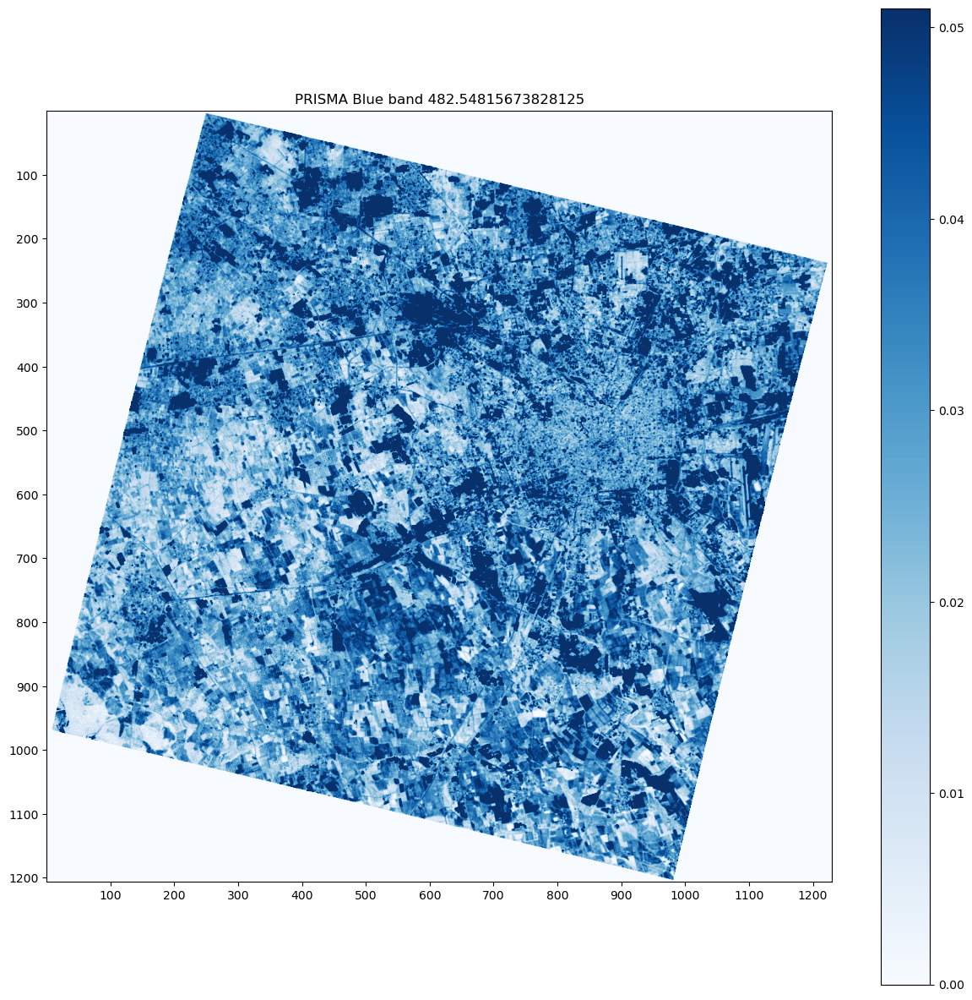

In [28]:
plt.figure(figsize = (15,15))
height, width = blue_band_prisma.shape
extent = [0, width, height, 0]  # left, right, bottom, top
plt.imshow(blue_band_prisma, cmap="Blues", vmin=-np.quantile(blue_band_prisma, 0.1), vmax=np.quantile(blue_band_prisma, 0.9), extent=extent)

plt.gca().xaxis.set_major_locator(MaxNLocator(integer=True, prune='both', nbins=width//100+1))
plt.gca().yaxis.set_major_locator(MaxNLocator(integer=True, prune='both', nbins=height//100+1))
plt.title(f'PRISMA Blue band {vnir_dict[idx_blue]}')
plt.colorbar()

'''Blue Band stored in a dedicated array'''
PRISMA_BlueBand = blue_band_prisma

## 2. <a id='sec2'></a>Importing the pre-processed Sentinel-2 image clipped to PRISMA image extent and resample it at 30m resolution
[Back to top](#TOC_TOP)

Let's import the pre-processed Sentinel-2 image (result of the first notebook `1 - S2_Preprocessing.ipynb`)

In [29]:
s2_path = "data/S2Clipped/s2_clipped_Q.tif"
S2clipped=rio.open(s2_path)
S2clipped.shape

(1796, 1823)

To scale Sentinel-2 to reflectance:

In [30]:
S2_scale = 10000

In [ ]:
with rio.open(s2_path) as src:
    # Read the data from the red, green, and blue bands
    data = src.read() / S2_scale  #indexes=[4, 3, 2]
    # Get the metadata of the source image
    src_meta = src.meta

Define the output desired resolution:

In [32]:
dst_resolution = 30

Get transform parameters from the input image:

In [33]:
src.transform[:]

(20.0, 0.0, 489000.0, 0.0, -20.0, 5050240.0, 0.0, 0.0, 1.0)

Update to new resolution the parameters:

In [34]:
dst_meta = src_meta.copy()
dst_meta.update({
    'height': int(src.height * src.transform[0] / dst_resolution),
    'width': int(src.width * src.transform[0] / dst_resolution),
    'transform': rio.Affine(dst_resolution, 0, src.bounds.left, 0, -dst_resolution, src.bounds.top),
    'dtype' : 'float32'
})

Resample using a **bilinear** interpolation with rasterio.reproject (it is possible to change the interpolation method):

In [35]:
resampled_data = np.zeros((src.count, dst_meta['height'], dst_meta['width']), dtype=data.dtype)
reproject(data,resampled_data,src_transform=src.transform,src_crs=src.crs, dst_transform=dst_meta['transform'], dst_crs=src.crs, resampling=Resampling.bilinear)

(array([[[0., 0., 0., ..., 0., 0., 0.],
         [0., 0., 0., ..., 0., 0., 0.],
         [0., 0., 0., ..., 0., 0., 0.],
         ...,
         [0., 0., 0., ..., 0., 0., 0.],
         [0., 0., 0., ..., 0., 0., 0.],
         [0., 0., 0., ..., 0., 0., 0.]],
 
        [[0., 0., 0., ..., 0., 0., 0.],
         [0., 0., 0., ..., 0., 0., 0.],
         [0., 0., 0., ..., 0., 0., 0.],
         ...,
         [0., 0., 0., ..., 0., 0., 0.],
         [0., 0., 0., ..., 0., 0., 0.],
         [0., 0., 0., ..., 0., 0., 0.]],
 
        [[0., 0., 0., ..., 0., 0., 0.],
         [0., 0., 0., ..., 0., 0., 0.],
         [0., 0., 0., ..., 0., 0., 0.],
         ...,
         [0., 0., 0., ..., 0., 0., 0.],
         [0., 0., 0., ..., 0., 0., 0.],
         [0., 0., 0., ..., 0., 0., 0.]],
 
        [[0., 0., 0., ..., 0., 0., 0.],
         [0., 0., 0., ..., 0., 0., 0.],
         [0., 0., 0., ..., 0., 0., 0.],
         ...,
         [0., 0., 0., ..., 0., 0., 0.],
         [0., 0., 0., ..., 0., 0., 0.],
         [0., 0

Save the resampled raster to a 30 m GeoTIFF file:

In [36]:
s2_30_path = "data/S2Clipped/30m__clip.tif"
# S2clipped=rio.open(s2_30_path)
# S2clipped.shape

In [37]:
with rio.open(s2_30_path, 'w', **dst_meta) as dst:
    dst.write(resampled_data)

In [38]:
sentinel_file = rio.open(s2_30_path)

Sentinel2_NirBand = sentinel_file.read(4)
Sentinel2_RedBand = sentinel_file.read(3)
Sentinel2_GreenBand = sentinel_file.read(2)
Sentinel2_BlueBand = sentinel_file.read(1)

In [39]:
sentinel_file.shape

(1197, 1215)

Plot Sentinel-2 Bands:

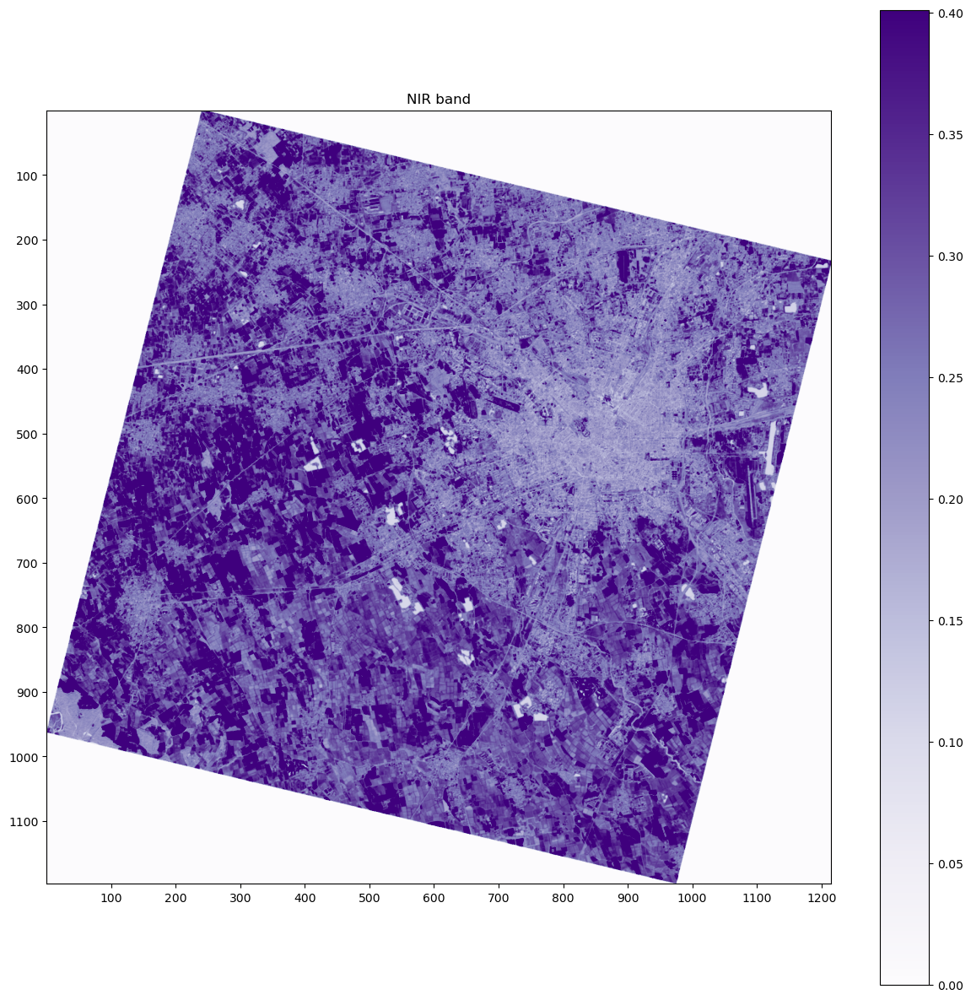

In [40]:
plt.figure(figsize = (15,15))
height, width = Sentinel2_NirBand.shape
extent = [0, width, height, 0]  # left, right, bottom, top
plt.imshow(Sentinel2_NirBand, cmap="Purples", vmin=-np.quantile(Sentinel2_NirBand, 0.1), vmax=np.quantile(Sentinel2_NirBand, 0.9), extent=extent)

plt.gca().xaxis.set_major_locator(MaxNLocator(integer=True, prune='both', nbins=width//100+1))
plt.gca().yaxis.set_major_locator(MaxNLocator(integer=True, prune='both', nbins=height//100+1))
plt.title('NIR band')
plt.colorbar()

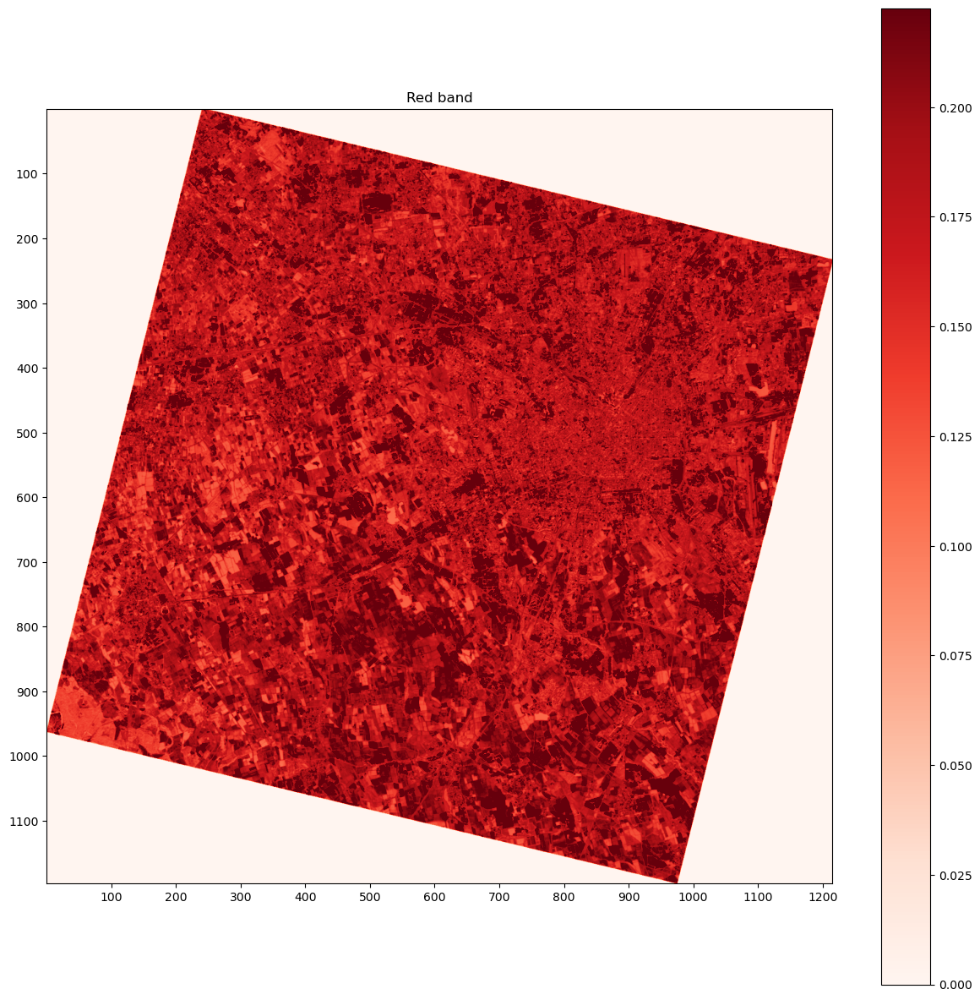

In [41]:
plt.figure(figsize = (15,15))
height, width = Sentinel2_RedBand.shape
extent = [0, width, height, 0]  # left, right, bottom, top
plt.imshow(Sentinel2_RedBand, cmap="Reds", vmin=-np.quantile(Sentinel2_RedBand, 0.1), vmax=np.quantile(Sentinel2_RedBand, 0.9), extent=extent)

plt.gca().xaxis.set_major_locator(MaxNLocator(integer=True, prune='both', nbins=width//100+1))
plt.gca().yaxis.set_major_locator(MaxNLocator(integer=True, prune='both', nbins=height//100+1))
plt.title('Red band')
plt.colorbar()

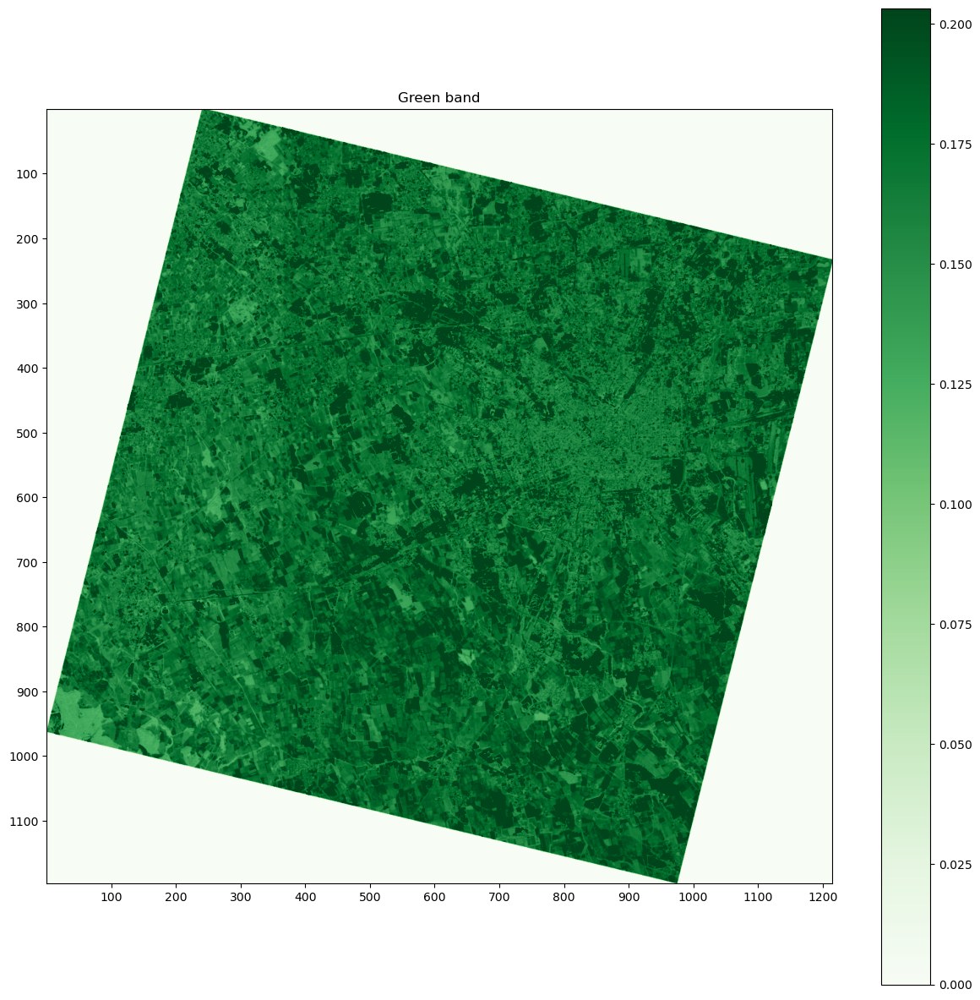

In [42]:
plt.figure(figsize = (15,15))
height, width = Sentinel2_GreenBand.shape
extent = [0, width, height, 0]  # left, right, bottom, top
plt.imshow(Sentinel2_GreenBand, cmap="Greens", vmin=-np.quantile(Sentinel2_GreenBand, 0.1), vmax=np.quantile(Sentinel2_GreenBand, 0.9), extent=extent)

plt.gca().xaxis.set_major_locator(MaxNLocator(integer=True, prune='both', nbins=width//100+1))
plt.gca().yaxis.set_major_locator(MaxNLocator(integer=True, prune='both', nbins=height//100+1))
plt.title('Green band')
plt.colorbar()

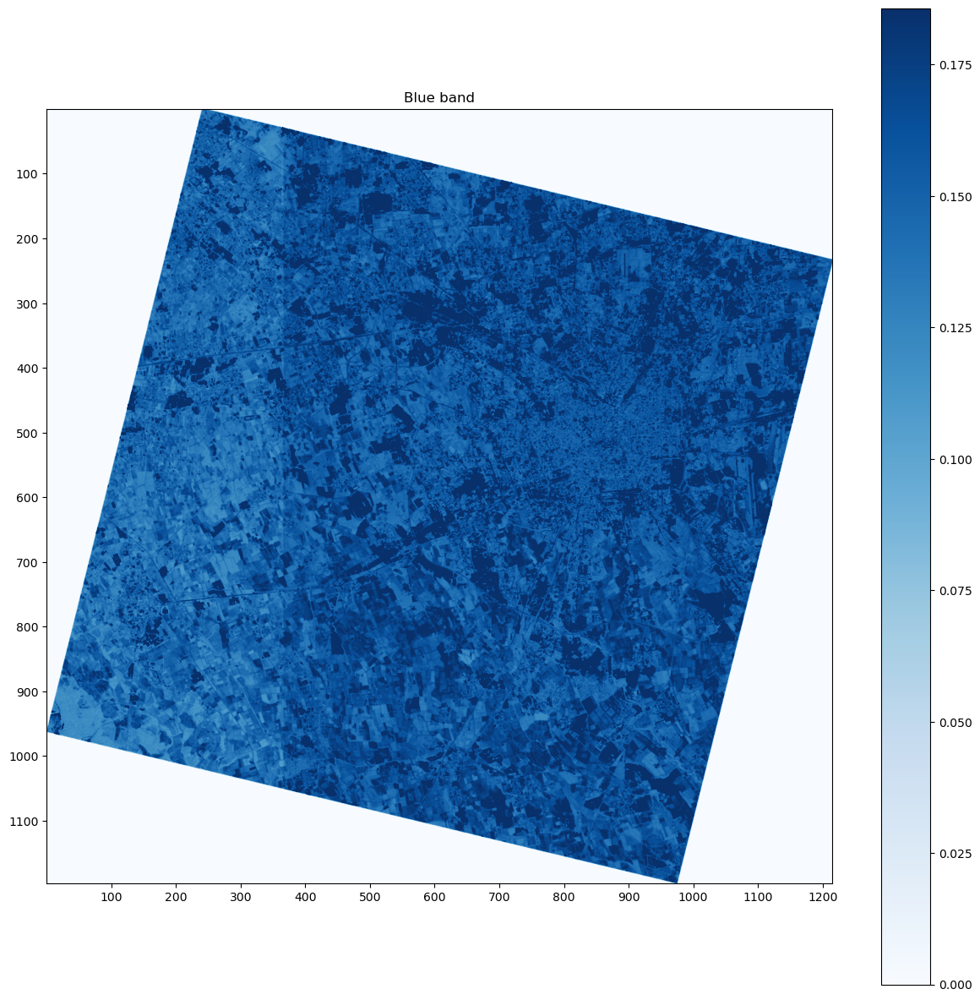

In [43]:
plt.figure(figsize = (15,15))
height, width = Sentinel2_BlueBand.shape
extent = [0, width, height, 0]  # left, right, bottom, top
plt.imshow(Sentinel2_BlueBand, cmap="Blues", vmin=-np.quantile(Sentinel2_BlueBand, 0.1), vmax=np.quantile(Sentinel2_BlueBand, 0.9), extent=extent)

plt.gca().xaxis.set_major_locator(MaxNLocator(integer=True, prune='both', nbins=width//100+1))
plt.gca().yaxis.set_major_locator(MaxNLocator(integer=True, prune='both', nbins=height//100+1))
plt.title('Blue band')
plt.colorbar()

### Export NOT coregistered PRISMA imagery (Red-Green-Blue-NIR) - RGBN

In [44]:
kwargs = {}
kwargs['driver'] = 'GTiff'
kwargs['dtype'] = 'float32'
kwargs['count'] = 4
kwargs['width'] = vrf_refl.shape[1]
kwargs['height'] = srf_refl.shape[0]
kwargs['dtype'] = 'float32'
kwargs['crs'] = rio.crs.CRS.from_epsg(32632)
kwargs['transform'] = rio.transform.Affine(dst_resolution, src.transform[1],src.transform[2], src.transform[3], -dst_resolution, src.transform[5])

In [45]:
# # Create a new raster file RGB (change the count number)
# with rio.open('rgb_PRISMA_NOTcoreg_image.tif', 'w', **kwargs) as dst:
#     # Write the RGB data to the raster file
#     dst.write(red_band_prisma, 1)
#     dst.write(green_band_prisma, 2)
#     dst.write(blue_band_prisma, 3)

In [46]:
# Create a new raster file RGBN
with rio.open('data/PRISMA/prisma_all_bands_NOTcoreg.tif', 'w', **kwargs) as dst:
    # Write the RGB data to the raster file
    dst.write(red_band_prisma, 1)
    dst.write(green_band_prisma, 2)
    dst.write(blue_band_prisma, 3)
    dst.write(nir_band_prisma, 4)

## 3. <a id='sec3'></a>Application of AROSICS algorithm
[Back to top](#TOC_TOP)

INTRO TO AROSICS


Firstly, let's define the parameters required by the algorithm. These values yield good results, however, it is possible to tune them !


In [47]:
# iteration = 4
# radius = [100, 100]
# rank = 4
# level = 5

In [48]:
# bands_dict_PRISMA = {'Blue':PRISMA_BlueBand,
#              'Green':PRISMA_GreenBand,
#              'Red':PRISMA_RedBand,
#              'NIR':PRISMA_NirBand}

# bands_dict_S2 = {'Blue':Sentinel2_BlueBand,
#              'Green':Sentinel2_GreenBand,
#              'Red':Sentinel2_RedBand,
#              'NIR':Sentinel2_NirBand}

It is possible to select the S2 and PRISMA bands to be used for coregistration. There are no noticeable differences between the use of differents bands as long as they are corresponding (e.g. PRISMA red band with S2 red band):

In [49]:
# w_band = widgets.RadioButtons(
#     options=['Blue', 'Green', 'Red', 'NIR'],
#     description='Select band for coregistration:',
#     disabled=False,
#     value='Red')
# w_band

In [50]:
# band_sel = w_band.value
# print(f"The band selected for coregistration is: {band_sel}")

The following piece of code applies the algorithm. The result is the estimated horizontal (u) and vertical (v) displacement. (REMINDER: the zeros outside the PRISMA image are intentionally left. Using np.nan gives some issues when processing with GeFolki algorithm):

In [51]:
#band coregistration
from arosics import COREG_LOCAL

crkwargs = {
    'grid_res'     : 30,
    'window_size'  : (64,64),
    'path_out'     : 'auto',
    'tieP_filter_level':3,
    'min_reliability': 0,
    'q'            : False,
}
# PRISMA_mask = bands_dict_PRISMA[band_sel]>0
# sentinel_mask = bands_dict_S2[band_sel]>0

# PRISMA_Band = bands_dict_PRISMA[band_sel]
refrence_path = "data/S2Clipped/s2_clip.tif"
s2=rio.open(refrence_path)
s2.shape
# with rio.open(refrence_path, 'w', **dst_meta) as dst:
#     dst.write(PRISMA_Band,indexes=1)
# Sentinel2_Band = bands_dict_S2[band_sel]
target_path = "data/PRISMA/prisma_all_bands_NOTcoreg.tif"
prisma=rio.open(target_path)
prisma.shape
# with rio.open(target_path, 'w', **dst_meta) as dst:
#     dst.write(Sentinel2_Band,indexes=1)

# u, v = EFolki(Sentinel2_Band, PRISMA_Band, iteration=iteration, radius=radius, rank=rank, levels=level)
CRL = COREG_LOCAL(refrence_path,
                  target_path,
                  **crkwargs)
CRL.correct_shifts()


c:\Users\Osama\miniconda3\envs\gepro\Lib\site-packages\numpy\core\_methods.py:181: RuntimeWarning: overflow encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
Polygonize progress     |==========----------------------------------------| 20.0% Complete  => 0:00:00

Calculating footprint polygon and actual data corner coordinates for reference image...


Polygonize progress     |==================================================| 100.0% Complete  => 0:00:00
Polygonize progress     |==========----------------------------------------| 20.0% Complete  => 0:00:00

Bounding box of calculated footprint for reference image:
	(488994.2539999997, 5014317.6416, 525464.6747011681, 5050248.2041)
Automatically detected nodata value for GeoArray_CoReg 'prisma_all_bands_NOTcoreg': 0.0
Calculating footprint polygon and actual data corner coordinates for image to be shifted...


Polygonize progress     |==================================================| 100.0% Complete  => 0:00:00


Bounding box of calculated footprint for image to be shifted:
	(489240.0, 5014150.0, 525660.0, 5050150.0)
Matching window position (X,Y): 507333.9542610811/5032251.360730213
Initializing tie points grid...


Warping progress     |===============-----------------------------------| 30.1% Complete  => 0:00:00

Equalizing pixel grids and projections of reference and target image...


Warping progress     |==================================================| 100.0% Complete  => 0:00:00
Warping progress     |==================================================| 100.0% Complete  => 0:00:00


Calculating tie point grid (1096 points) using 4 CPU cores...


	progress: |==================================================| 100.0% Complete  => 0:01:47


Found 26 matches.
Performing validity checks...
0 tie points flagged by level 1 filtering (reliability).
2 tie points flagged by level 2 filtering (SSIM).


c:\Users\Osama\miniconda3\envs\gepro\Lib\site-packages\arosics\Tie_Point_Grid.py:1196: FutureWarning: `random_state` is a deprecated argument name for `ransac`. It will be removed in version 0.23. Please use `rng` instead.
  ransac((src_coords, est_coords),


2 tie points flagged by level 3 filtering (RANSAC)
22 valid tie points remain after filtering.
Automatically detected nodata value for GeoArray 'prisma_all_bands_NOTcoreg': 0.0
Correcting geometric shifts...


c:\Users\Osama\miniconda3\envs\gepro\Lib\site-packages\arosics\DeShifter.py:291: UserWarning: 
The coordinate grid of prisma_all_bands_NOTcoreg cannot be aligned to the desired grid because their pixel sizes are not exact multiples of each other (input [X/Y]: 30.0/30.0; desired [X/Y]: 19.99474819144234/19.99474819097668). Therefore the original grid is chosen for the resampled output image. If you don´t like that you can use the 'out_gsd' or 'match_gsd' parameters to set an appropriate output pixel size or to allow changing the pixel size.

  warnings.warn("\nThe coordinate grid of %s cannot be aligned to the desired grid because their pixel "
Translating progress |==================================================| 100.0% Complete  => 0:00:00
Warping progress     |==================================================| 100.0% Complete  => 0:00:00


Writing GeoArray of size (1206, 1230, 4) to c:\Users\Osama\Documents\GitHub\GeoinformaticsProject\data\PRISMA\prisma_all_bands_NOTcoreg__shifted_to__s2_clip.bsq.


OrderedDict([('band', None),
             ('is shifted', True),
             ('is resampled', True),
             ('updated map info',
              ['UTM',
               1.0,
               1.0,
               489000.0,
               5050240.0,
               30.0,
               30.0,
               32,
               'North',
               'WGS-84']),
             ('updated geotransform',
              (489000.0, 30.0, 0.0, 5050240.0, 0.0, -30.0)),
             ('updated projection',
              'PROJCS["WGS 84 / UTM zone 32N",GEOGCS["WGS 84",DATUM["WGS_1984",SPHEROID["WGS 84",6378137,298.257223563,AUTHORITY["EPSG","7030"]],AUTHORITY["EPSG","6326"]],PRIMEM["Greenwich",0],UNIT["degree",0.0174532925199433,AUTHORITY["EPSG","9122"]],AUTHORITY["EPSG","4326"]],PROJECTION["Transverse_Mercator"],PARAMETER["latitude_of_origin",0],PARAMETER["central_meridian",9],PARAMETER["scale_factor",0.9996],PARAMETER["false_easting",500000],PARAMETER["false_northing",0],UNIT["metre",1,AUTHORITY["EPSG

Check `u` and `v` vectors calculated by GeFolki algorithm, to show the tranformation applied:

In [52]:
# u.shape

CRL.show_image_footprints()

visualize tie point grid with shifts present AFTER shift correction

The remaining shifts after local correction can be calculated and visualized by instanciating the arosics.COREG_LOCAL with the output path of the above instance of COREG_LOCAL.

Note: array has been downsampled to 1000 x 985 for faster visualization.


c:\Users\Osama\miniconda3\envs\gepro\Lib\site-packages\numpy\core\_methods.py:215: RuntimeWarning: overflow encountered in reduce
  arrmean = umr_sum(arr, axis, dtype, keepdims=True, where=where)


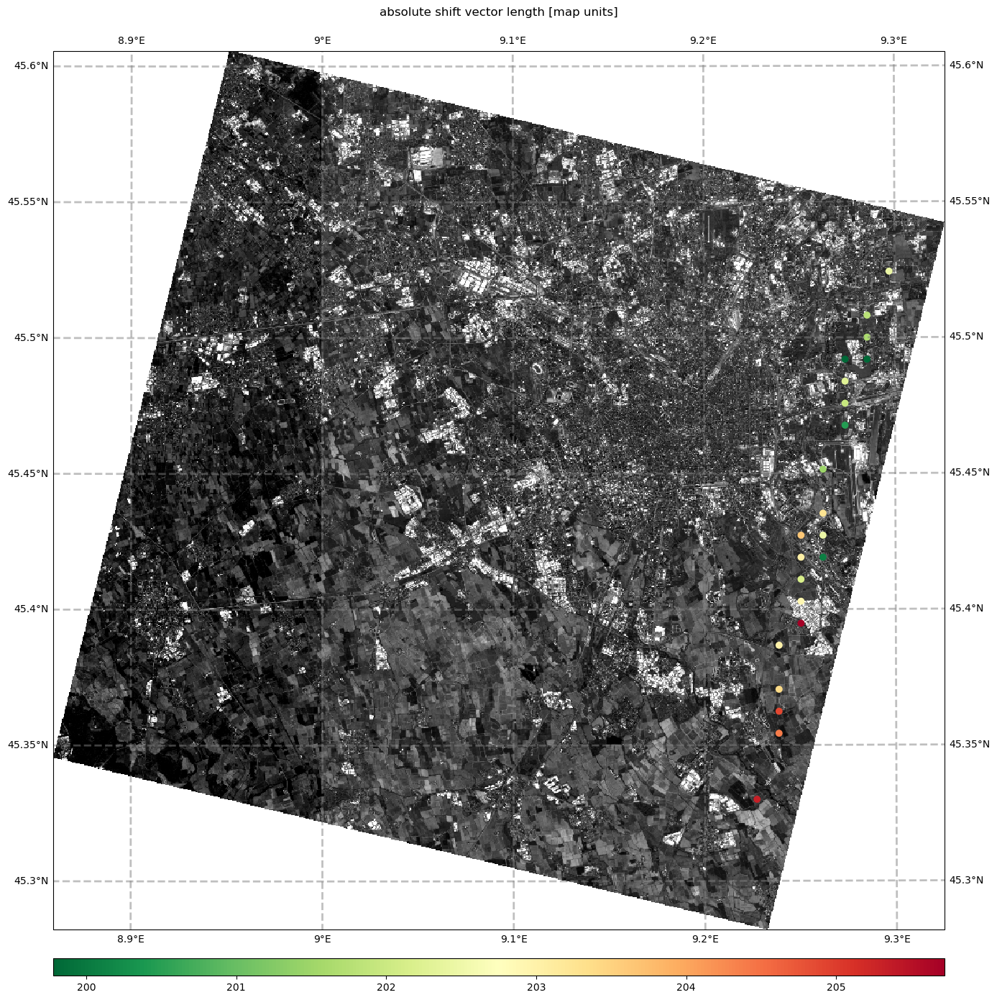

In [53]:
CRL.view_CoRegPoints(figsize=(15,15), backgroundIm='ref')

show the points table of the calculated tie point grid

In [54]:
CRL.CoRegPoints_table

,geometry,POINT_ID,X_IM,Y_IM,X_MAP,Y_MAP,REF_BADDATA,TGT_BADDATA,X_WIN_SIZE,Y_WIN_SIZE,...,ANGLE,SSIM_BEFORE,SSIM_AFTER,SSIM_IMPROVED,RELIABILITY,LAST_ERR,L1_OUTLIER,L2_OUTLIER,L3_OUTLIER,OUTLIER
0,POINT (497100.000 5049340.000),51,270,30,497100.0,5049340.0,False,False,36.0,34.0,...,-9999.0,-9999.0,-9999.0,-9999,-9999.0,The calculated shift (X: -8.334978742912117 px...,-9999,-9999,-9999,-9999
1,POINT (498000.000 5049340.000),52,300,30,498000.0,5049340.0,False,False,24.0,22.0,...,-9999.0,-9999.0,-9999.0,-9999,-9999.0,No match found in the given window.,-9999,-9999,-9999,-9999
2,POINT (498900.000 5049340.000),53,330,30,498900.0,5049340.0,False,False,-9999.0,-9999.0,...,-9999.0,-9999.0,-9999.0,-9999,-9999.0,One of the input images does not have sufficie...,-9999,-9999,-9999,-9999
3,POINT (499800.000 5049340.000),54,360,30,499800.0,5049340.0,False,False,-9999.0,-9999.0,...,-9999.0,-9999.0,-9999.0,-9999,-9999.0,One of the input images does not have sufficie...,-9999,-9999,-9999,-9999
4,POINT (496200.000 5048440.000),92,240,60,496200.0,5048440.0,False,False,-9999.0,-9999.0,...,-9999.0,-9999.0,-9999.0,-9999,-9999.0,One of the input images does not have sufficie...,-9999,-9999,-9999,-9999
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1091,POINT (517800.000 5016040.000),1628,960,1140,517800.0,5016040.0,False,False,44.0,44.0,...,-9999.0,-9999.0,-9999.0,-9999,-9999.0,The calculated shift (X: -4.6170801271124065 p...,-9999,-9999,-9999,-9999
1092,POINT (515100.000 5015140.000),1667,870,1170,515100.0,5015140.0,False,False,-9999.0,-9999.0,...,-9999.0,-9999.0,-9999.0,-9999,-9999.0,One of the input images does not have sufficie...,-9999,-9999,-9999,-9999
1093,POINT (516000.000 5015140.000),1668,900,1170,516000.0,5015140.0,False,False,-9999.0,-9999.0,...,-9999.0,-9999.0,-9999.0,-9999,-9999.0,One of the input images does not have sufficie...,-9999,-9999,-9999,-9999
1094,POINT (516900.000 5015140.000),1669,930,1170,516900.0,5015140.0,False,False,26.0,24.0,...,-9999.0,-9999.0,-9999.0,-9999,-9999.0,No match found in the given window.,-9999,-9999,-9999,-9999


In [55]:
CRL.CoRegPoints_table.columns

Index(['geometry', 'POINT_ID', 'X_IM', 'Y_IM', 'X_MAP', 'Y_MAP', 'REF_BADDATA',
       'TGT_BADDATA', 'X_WIN_SIZE', 'Y_WIN_SIZE', 'X_SHIFT_PX', 'Y_SHIFT_PX',
       'X_SHIFT_M', 'Y_SHIFT_M', 'ABS_SHIFT', 'ANGLE', 'SSIM_BEFORE',
       'SSIM_AFTER', 'SSIM_IMPROVED', 'RELIABILITY', 'LAST_ERR', 'L1_OUTLIER',
       'L2_OUTLIER', 'L3_OUTLIER', 'OUTLIER'],
      dtype='object')

c:\Users\Osama\miniconda3\envs\gepro\Lib\site-packages\numpy\core\_methods.py:181: RuntimeWarning: overflow encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
Polygonize progress     |====----------------------------------------------| 8.0% Complete  => 0:00:00

Calculating footprint polygon and actual data corner coordinates for reference image...


Polygonize progress     |==================================================| 100.0% Complete  => 0:00:00
Polygonize progress     |--------------------------------------------------| 0.0% Complete  => 0:00:00

Bounding box of calculated footprint for reference image:
	(488994.2539999997, 5014317.6416, 525464.6747011681, 5050248.2041)
Calculating footprint polygon and actual data corner coordinates for image to be shifted...


Polygonize progress     |==================================================| 100.0% Complete  => 0:00:00


Bounding box of calculated footprint for image to be shifted:
	(489000.0, 5014300.0, 525540.0, 5050120.0)
Matching window position (X,Y): 507227.89459361095/5032269.449495651
Note: array has been downsampled to 1000 x 985 for faster visualization.
Initializing tie points grid...


c:\Users\Osama\miniconda3\envs\gepro\Lib\site-packages\numpy\core\_methods.py:215: RuntimeWarning: overflow encountered in reduce
  arrmean = umr_sum(arr, axis, dtype, keepdims=True, where=where)
Warping progress     |===================-------------------------------| 37.3% Complete  => 0:00:00

Equalizing pixel grids and projections of reference and target image...


Warping progress     |==================================================| 100.0% Complete  => 0:00:00
Warping progress     |==================================================| 100.0% Complete  => 0:00:00


Calculating tie point grid (1099 points) using 4 CPU cores...


	progress: |==================================================| 100.0% Complete  => 0:02:22


Found 1025 matches.
Performing validity checks...
0 tie points flagged by level 1 filtering (reliability).
131 tie points flagged by level 2 filtering (SSIM).


c:\Users\Osama\miniconda3\envs\gepro\Lib\site-packages\arosics\Tie_Point_Grid.py:1196: FutureWarning: `random_state` is a deprecated argument name for `ransac`. It will be removed in version 0.23. Please use `rng` instead.
  ransac((src_coords, est_coords),


94 tie points flagged by level 3 filtering (RANSAC)
800 valid tie points remain after filtering.


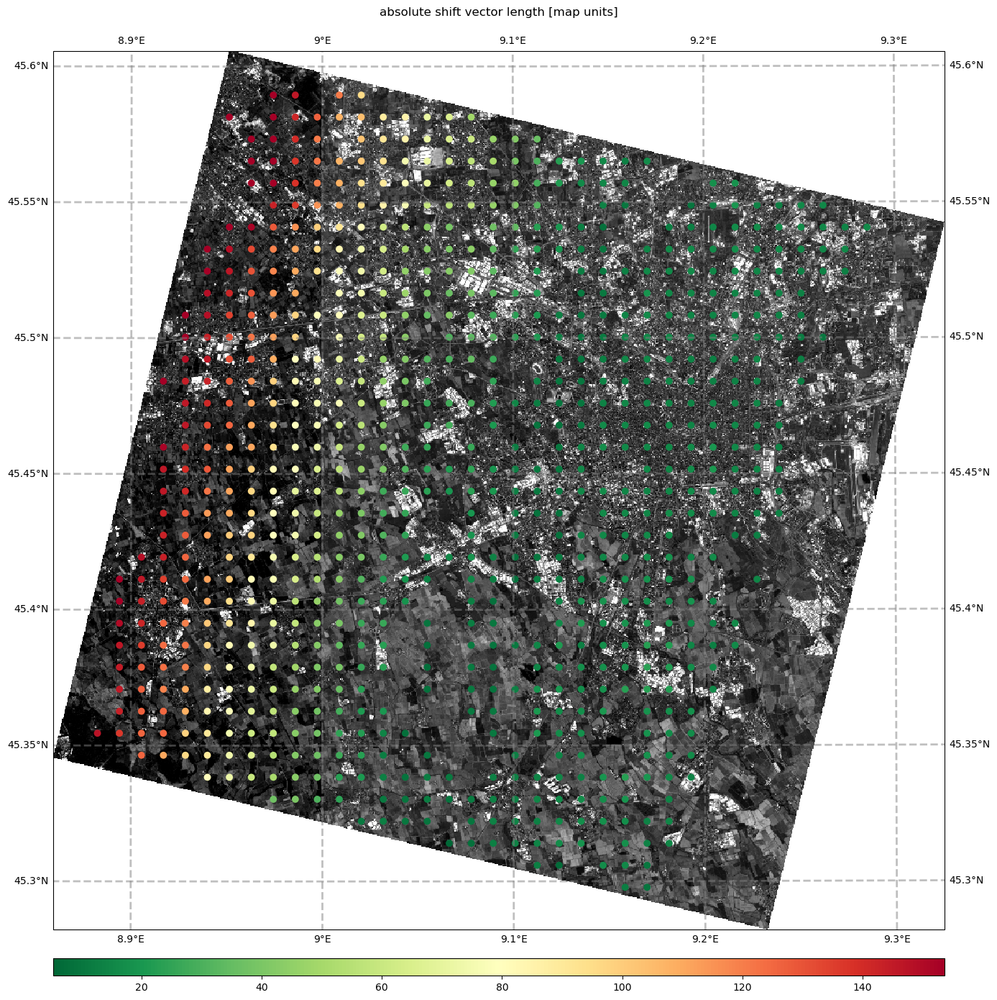

In [56]:
CRL_after_corr = COREG_LOCAL(refrence_path, CRL.path_out, **crkwargs)
CRL_after_corr.view_CoRegPoints(figsize=(15,15),backgroundIm='ref')

In [57]:
CRL_after_corr.CoRegPoints_table

,geometry,POINT_ID,X_IM,Y_IM,X_MAP,Y_MAP,REF_BADDATA,TGT_BADDATA,X_WIN_SIZE,Y_WIN_SIZE,...,ANGLE,SSIM_BEFORE,SSIM_AFTER,SSIM_IMPROVED,RELIABILITY,LAST_ERR,L1_OUTLIER,L2_OUTLIER,L3_OUTLIER,OUTLIER
0,POINT (496200.000 5049340.000),50,240,30,496200.0,5049340.0,False,False,-9999.0,-9999.0,...,-9999.000000,-9999.000000,-9999.000000,-9999,-9999.000000,One of the input images does not have sufficie...,-9999,-9999,-9999,-9999
1,POINT (497100.000 5049340.000),51,270,30,497100.0,5049340.0,False,False,30.0,28.0,...,-9999.000000,-9999.000000,-9999.000000,-9999,-9999.000000,The calculated shift (X: 2.2585684738071437 px...,-9999,-9999,-9999,-9999
2,POINT (498000.000 5049340.000),52,300,30,498000.0,5049340.0,False,False,18.0,16.0,...,171.756886,-0.086841,0.099955,True,0.000000,-9999,False,False,True,True
3,POINT (498900.000 5049340.000),53,330,30,498900.0,5049340.0,False,False,-9999.0,-9999.0,...,-9999.000000,-9999.000000,-9999.000000,-9999,-9999.000000,One of the input images does not have sufficie...,-9999,-9999,-9999,-9999
4,POINT (496200.000 5048440.000),92,240,60,496200.0,5048440.0,False,False,22.0,22.0,...,-9999.000000,-9999.000000,-9999.000000,-9999,-9999.000000,The matching window became too small for calcu...,-9999,-9999,-9999,-9999
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1094,POINT (517800.000 5016040.000),1628,960,1140,517800.0,5016040.0,False,False,44.0,44.0,...,217.239394,0.598788,0.644135,True,65.288999,-9999,False,False,True,True
1095,POINT (515100.000 5015140.000),1667,870,1170,515100.0,5015140.0,False,False,-9999.0,-9999.0,...,-9999.000000,-9999.000000,-9999.000000,-9999,-9999.000000,One of the input images does not have sufficie...,-9999,-9999,-9999,-9999
1096,POINT (516000.000 5015140.000),1668,900,1170,516000.0,5015140.0,False,False,-9999.0,-9999.0,...,-9999.000000,-9999.000000,-9999.000000,-9999,-9999.000000,One of the input images does not have sufficie...,-9999,-9999,-9999,-9999
1097,POINT (516900.000 5015140.000),1669,930,1170,516900.0,5015140.0,False,False,26.0,24.0,...,221.453241,0.872753,0.860583,False,35.212504,-9999,False,True,False,True


In [58]:
CRL_after_corr.CoRegPoints_table.columns

Index(['geometry', 'POINT_ID', 'X_IM', 'Y_IM', 'X_MAP', 'Y_MAP', 'REF_BADDATA',
       'TGT_BADDATA', 'X_WIN_SIZE', 'Y_WIN_SIZE', 'X_SHIFT_PX', 'Y_SHIFT_PX',
       'X_SHIFT_M', 'Y_SHIFT_M', 'ABS_SHIFT', 'ANGLE', 'SSIM_BEFORE',
       'SSIM_AFTER', 'SSIM_IMPROVED', 'RELIABILITY', 'LAST_ERR', 'L1_OUTLIER',
       'L2_OUTLIER', 'L3_OUTLIER', 'OUTLIER'],
      dtype='object')

In [59]:
CRL.tiepoint_grid.calc_overall_stats()

{'N_TP': 26,
 'N_VALID_TP': 22,
 'N_INVALID_TP': 4,
 'PERC_VALID_TP': 84.61538461538461,
 'RMSE_M': 202.5600722868233,
 'RMSE_X_M': 143.71490179028444,
 'RMSE_Y_M': 142.74666331740292,
 'RMSE_X_PX': 4.790496726342833,
 'RMSE_Y_PX': 4.75822211057897,
 'MSE_M': 41030.58288484308,
 'MSE_X_M': 20653.972996591106,
 'MSE_Y_M': 20376.609888251987,
 'MSE_X_PX': 22.9488588851014,
 'MSE_Y_PX': 22.640677653602584,
 'MAE_M': 202.5532928525028,
 'MAE_X_M': 143.69055795110233,
 'MAE_Y_M': 142.72426155599004,
 'MAE_X_PX': 4.789685265036763,
 'MAE_Y_PX': 4.757475385198549,
 'MEAN_ABS_SHIFT': 202.5532928525028,
 'MEAN_X_SHIFT_M': -143.69055795110233,
 'MEAN_Y_SHIFT_M': 142.72426155599004,
 'MEAN_X_SHIFT_PX': -4.789685265036762,
 'MEAN_Y_SHIFT_PX': -4.75747538519855,
 'MEAN_ANGLE': 134.80716743601997,
 'MEAN_SSIM_BEFORE': 0.16904292151194958,
 'MEAN_SSIM_AFTER': 0.7374742717669741,
 'MEAN_RELIABILITY': 64.06294012418846,
 'MEDIAN_ABS_SHIFT': 202.46234151017046,
 'MEDIAN_X_SHIFT_M': -143.9927970484423,
 

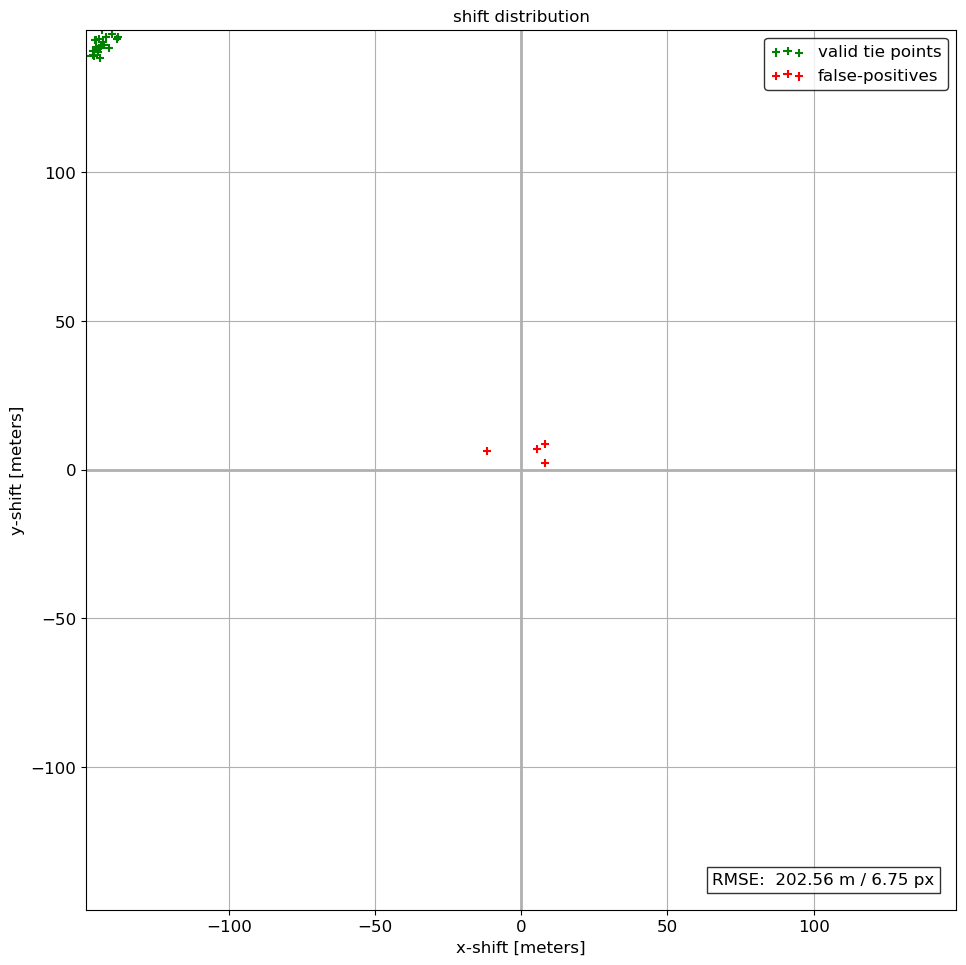

In [60]:
CRL.tiepoint_grid.plot_shift_distribution(include_outliers=True)

In [61]:
CRL_after_corr.tiepoint_grid.calc_overall_stats()

{'N_TP': 1025,
 'N_VALID_TP': 800,
 'N_INVALID_TP': 225,
 'PERC_VALID_TP': 78.04878048780488,
 'RMSE_M': 66.22828334592243,
 'RMSE_X_M': 31.430853905772825,
 'RMSE_Y_M': 58.29482770968417,
 'RMSE_X_PX': 1.0476951301924273,
 'RMSE_Y_PX': 1.9431609236567196,
 'MSE_M': 4386.185514947787,
 'MSE_X_M': 987.8985772460347,
 'MSE_Y_M': 3398.2869377017614,
 'MSE_X_PX': 1.0976650858289272,
 'MSE_Y_PX': 3.775874375226435,
 'MAE_M': 48.992748419119636,
 'MAE_X_M': 24.402955979962133,
 'MAE_Y_M': 41.63678784767049,
 'MAE_X_PX': 0.8134318659987373,
 'MAE_Y_PX': 1.3878929282561256,
 'MEAN_ABS_SHIFT': 48.99274841911965,
 'MEAN_X_SHIFT_M': 18.062818266229005,
 'MEAN_Y_SHIFT_M': 32.738144983559614,
 'MEAN_X_SHIFT_PX': 0.6020939422076436,
 'MEAN_Y_SHIFT_PX': -1.0912714994522756,
 'MEAN_ANGLE': 167.76834336657456,
 'MEAN_SSIM_BEFORE': 0.47892625398536653,
 'MEAN_SSIM_AFTER': 0.7070100169046918,
 'MEAN_RELIABILITY': 71.45079230996849,
 'MEDIAN_ABS_SHIFT': 23.637150072039397,
 'MEDIAN_X_SHIFT_M': 12.60192630

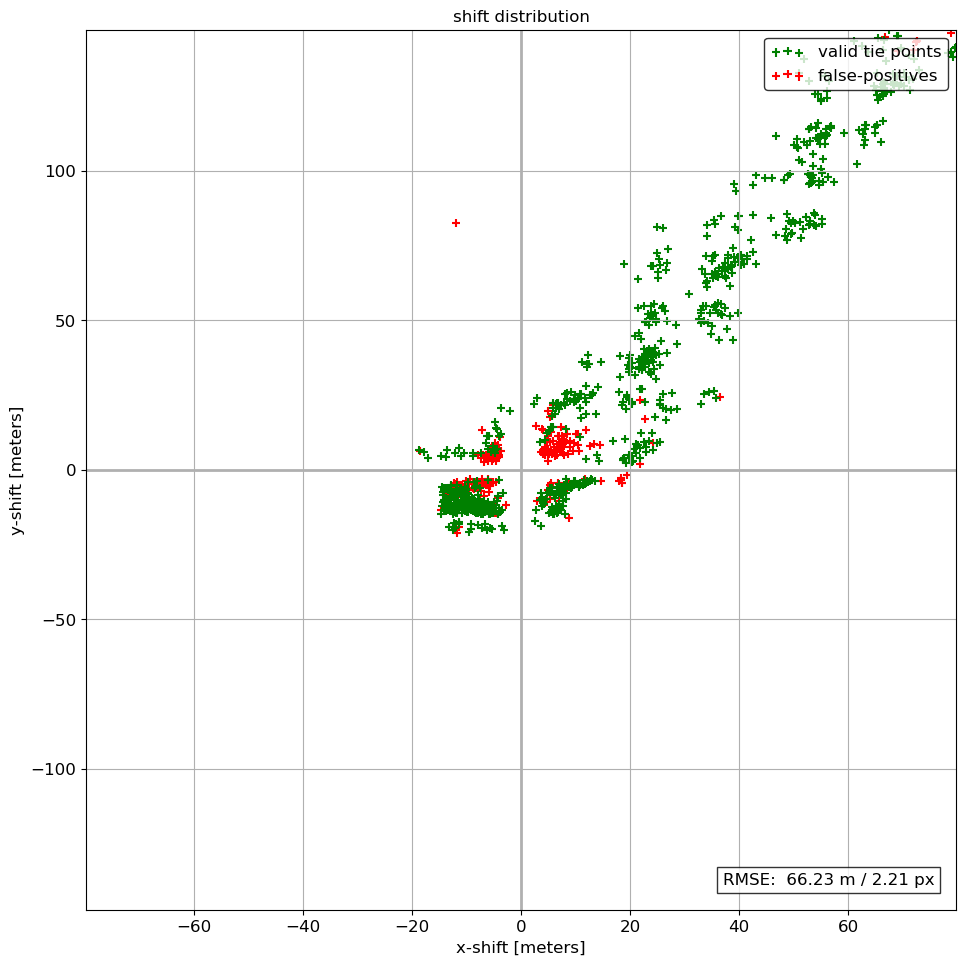

In [62]:
CRL_after_corr .tiepoint_grid.plot_shift_distribution(include_outliers=True)

In [63]:
CRL.tiepoint_grid.calc_rmse()

202.5600722868233

In [64]:
CRL_after_corr.tiepoint_grid.calc_rmse()

66.22828334592243

In [65]:
CRL.tiepoint_grid.mean_x_shift_px


-4.0397486065482715

In [66]:
CRL_after_corr.tiepoint_grid.mean_x_shift_px

0.48229564422644206

In [67]:
CRL.tiepoint_grid.mean_y_shift_px

-4.056413831320514

In [68]:
CRL_after_corr.tiepoint_grid.mean_y_shift_px

-0.893261048797158

Shift before coregistration

In [70]:
# plt.scatter(CRL.CoRegPoints_table[[ 'POINT_ID']] , CRL.CoRegPoints_table[[ 'xRisiduals']], label='Before Correction',marker='+', c='r',)
# plt.xlabel('Point ID')
# plt.ylabel('point xRisiduals')
# plt.title('Risidual Points ')
# plt.legend()
# plt.show()

In [ ]:
# # afunction to calculate RMSE
# def calculate_rmse(detected_shifts_before, detected_shifts_after):
#     # Convert the lists to numpy arrays
#     before = np.array(detected_shifts_before)
#     after = np.array(detected_shifts_after)
    
#     # Calculate the squared differences between before and after
#     squared_diff = np.square(after - before)
    
#     # Calculate the mean of the squared differences
#     mean_squared_diff = np.mean(squared_diff)
    
#     # Calculate the RMSE by taking the square root of the mean squared difference
#     rmse = np.sqrt(mean_squared_diff)
    
#     return rmse

In [ ]:
# detected_shifts_before=CRL.CoRegPoints_table[['SSIM_BEFORE']]
# detected_shifts_after=CRL.CoRegPoints_table[[ 'SSIM_AFTER']]
# rmse_result=calculate_rmse(detected_shifts_before, detected_shifts_after)
# print(f"RMSE Result: {rmse_result:.2f}")